In [102]:
import os
import re
import pandas as pd
from sqlalchemy import create_engine
from dotenv import load_dotenv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import plotly.express as px
from pylab import rcParams
import warnings
import seaborn as sns
from scipy.stats import pearsonr, ttest_ind, f_oneway, chi2_contingency
from sklearn.linear_model import LinearRegression

In [103]:
rcParams["figure.figsize"]=(30,18)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'DejaVu Sans'  # use a default font
plt.rcParams['font.weight'] = 'bold'
plt.rcParams['font.size'] = 15
warnings.filterwarnings("ignore")
warnings.simplefilter(action='ignore', category=FutureWarning)

In [104]:
# Load the environment variables from the file
load_dotenv('environment.env')

# Get the environment variables
PGPASSWORD = os.getenv('PGPASSWORD')
PGHOST = os.getenv('PGHOST')
PGUSER = os.getenv('PGUSER')
PGPORT = os.getenv('PGPORT')
PGDATABASE = os.getenv('PGDATABASE')

# Create the PostgreSQL connection string
connection_string = f'postgresql://{PGUSER}:{PGPASSWORD}@{PGHOST}:{PGPORT}/{PGDATABASE}'

# Create an engine that connects to PostgreSQL server
engine = create_engine(connection_string)

In [105]:
# create a DataFrame from the 'materials' table
df = pd.read_sql('materials', engine)
df

,material,su,sy,e,g,mu,ro,use
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True
...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False


In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1552 entries, 0 to 1551
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   material  1552 non-null   object 
 1   su        1552 non-null   int64  
 2   sy        1552 non-null   int64  
 3   e         1552 non-null   int64  
 4   g         1552 non-null   int64  
 5   mu        1552 non-null   float64
 6   ro        1552 non-null   int64  
 7   use       1552 non-null   bool   
dtypes: bool(1), float64(1), int64(5), object(1)
memory usage: 86.5+ KB


In [107]:
df.isnull().sum()

material    0
su          0
sy          0
e           0
g           0
mu          0
ro          0
use         0
dtype: int64

In [108]:
# Drop Duplicates
df.duplicated().sum()
df=df.copy()
duplicated_rows = df[df.duplicated()]
duplicated_names = duplicated_rows['material'].unique()
print(duplicated_names)
df.drop_duplicates(inplace=True)
df

['NF NF XC42TS ' 'NF NF XC55H1 ' 'NF NF Z15CN2413 ' 'NF NF Z12CNS2520 ']


,material,su,sy,e,g,mu,ro,use
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True
...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False


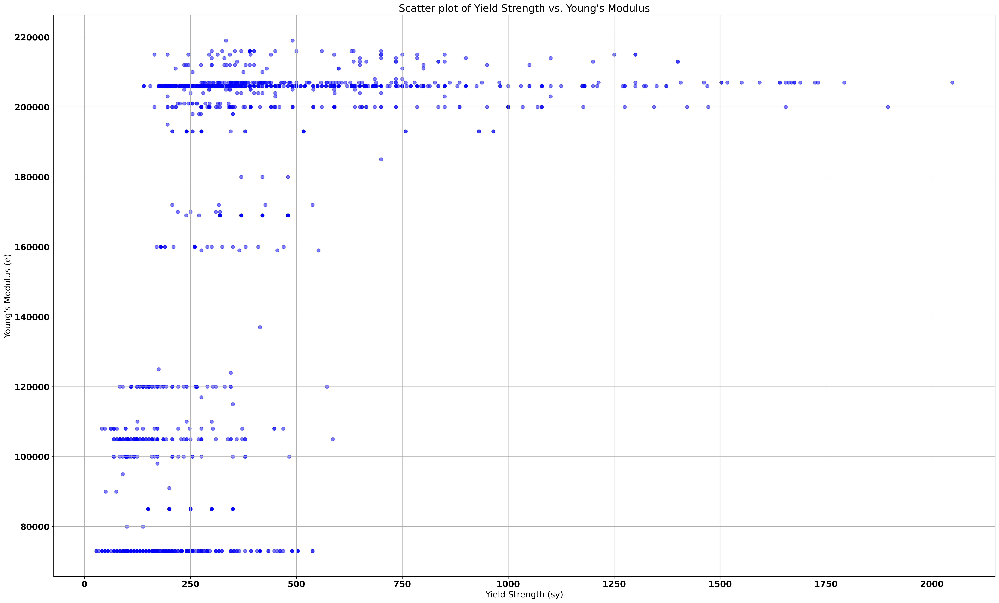

In [109]:
plt.scatter(df['sy'], df['e'], c='blue', alpha=0.5)
plt.xlabel('Yield Strength (sy)')
plt.ylabel("Young's Modulus (e)")
plt.title("Scatter plot of Yield Strength vs. Young's Modulus")
plt.grid(True)
plt.show()


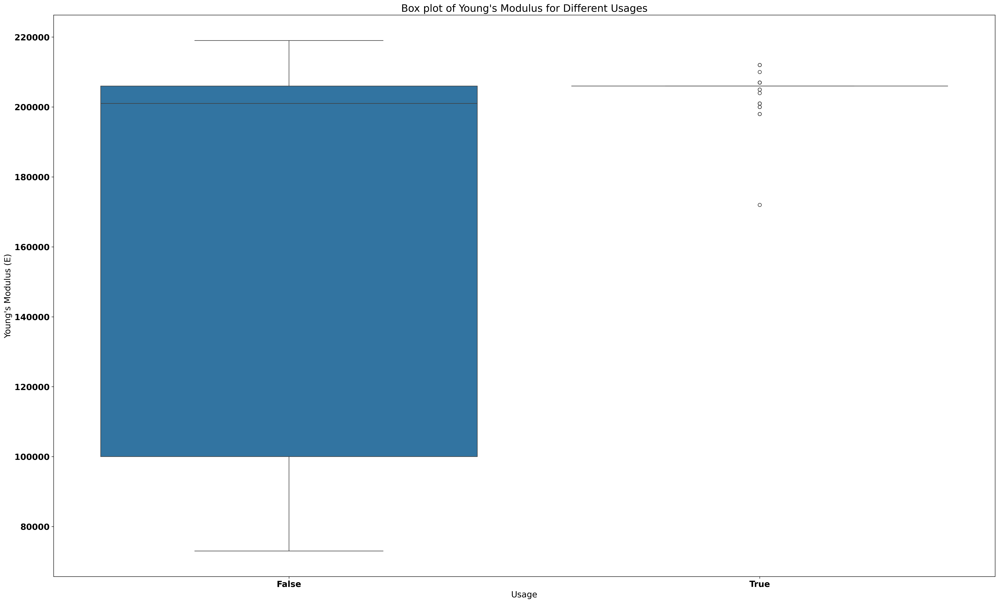

In [110]:
sns.boxplot(x='use', y='e', data=df)
plt.xlabel('Usage')
plt.ylabel("Young's Modulus (E)")
plt.title("Box plot of Young's Modulus for Different Usages")
plt.xticks(ticks=[0, 1], labels=['False', 'True'])
plt.show()

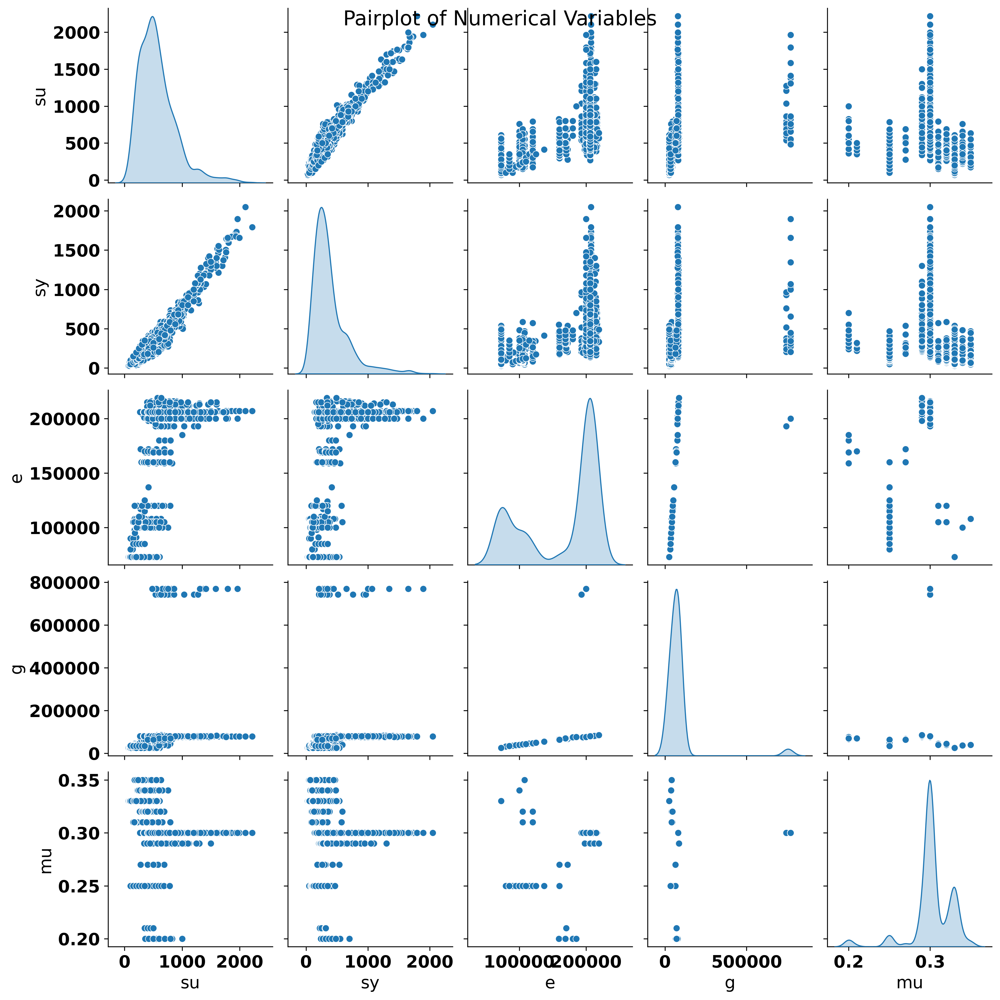

In [111]:
sns.pairplot(df.drop(columns=['use', 'ro']), diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables')
plt.show()


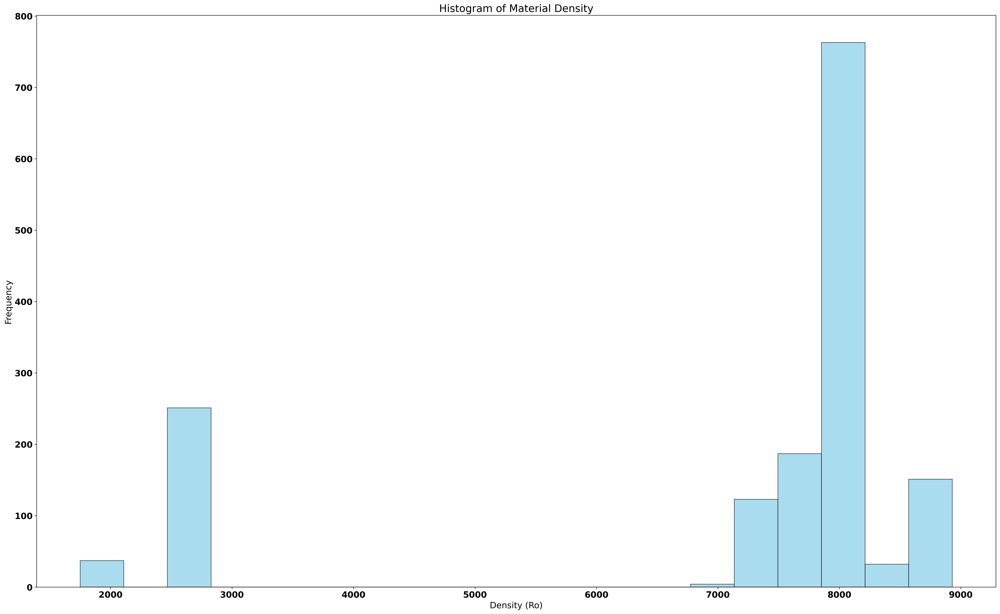

In [112]:
plt.hist(df['ro'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
plt.xlabel('Density (Ro)')
plt.ylabel('Frequency')
plt.title('Histogram of Material Density')
plt.show()


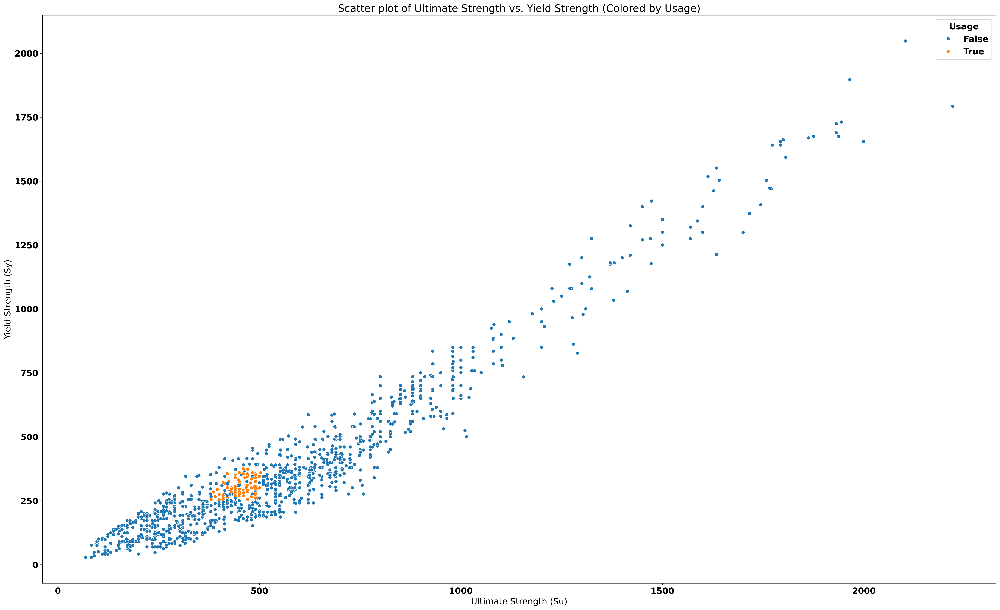

In [113]:
sns.scatterplot(x='su', y='sy', hue='use', data=df)
plt.xlabel('Ultimate Strength (Su)')
plt.ylabel('Yield Strength (Sy)')
plt.title('Scatter plot of Ultimate Strength vs. Yield Strength (Colored by Usage)')
plt.legend(title='Usage')
plt.show()


In [114]:
def get_rating(row):
    conditions = [
        (438.3 <= row['su'] <= 535.7, 318.6 <= row['sy'] <= 389.4, 204930 <= row['e'] <= 209070, 71100 <= row['g'] <= 86900, 0.285 <= row['mu'] <= 0.315, 7467 <= row['ro'] <= 8253),
        (389.6 <= row['su'] <= 584.4, 283.2 <= row['sy'] <= 424.8, 202860 <= row['e'] <= 211140, 63200 <= row['g'] <= 94800, 0.27 <= row['mu'] <= 0.33, 7074 <= row['ro'] <= 8646),
        (340.9 <= row['su'] <= 633.1, 247.8 <= row['sy'] <= 460.2, 200790 <= row['e'] <= 213210, 55300 <= row['g'] <= 102700, 0.255 <= row['mu'] <= 0.345, 6681 <= row['ro'] <= 9039),
        (292.2 <= row['su'] <= 681.8, 212.4 <= row['sy'] <= 495.6, 198720 <= row['e'] <= 215280, 47400 <= row['g'] <= 110600, 0.24 <= row['mu'] <= 0.36, 6288 <= row['ro'] <= 9432)
    ]
    ratings = [5, 4, 3, 2]

    for rating, condition in zip(ratings, conditions):
        if all(condition):
            return rating
    return 1



In [115]:
df['rating'] = df.apply(get_rating, axis=1)
df

,material,su,sy,e,g,mu,ro,use,rating
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,True,4
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,True,4
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,True,3
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,True,5
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,True,5
...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,False,1
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,False,1
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,False,1
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,False,1


In [116]:
df['use'] = df['use'].astype(int)
df

,material,su,sy,e,g,mu,ro,use,rating
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5
...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1


In [117]:
df['su/sy'] = df['su'] / df['sy']
df

,material,su,sy,e,g,mu,ro,use,rating,su/sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [118]:
#df = df[(df['Su'] - df['Su'].mean()).abs() < 3 * df['Su'].std()]
df



,material,su,sy,e,g,mu,ro,use,rating,su/sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [119]:


numeric_df = df.select_dtypes(include=np.number)

# Correlation Analysis
correlation_matrix = numeric_df.corr()

# T-Test or ANOVA - Example: Compare 'Su' across different 'Use' categories
t_statistic, p_value = ttest_ind(numeric_df[numeric_df['use'] == 0]['su'], numeric_df[numeric_df['use'] == 1]['su'])
# Alternatively, for ANOVA across multiple categories, replace 'Category' with another categorical column if available.
#f_statistic, p_value_anova = f_oneway(numeric_df[numeric_df['Category'] == 'A']['Su'], numeric_df[numeric_df['Category'] == 'B']['Su'], numeric_df[numeric_df['Category'] == 'C']['Su'])

# Chi-Square Test - Example: Test independence between 'Use' and 'Rating' categories
chi2_statistic, chi2_p_value, _, _ = chi2_contingency(pd.crosstab(df['use'], df['rating']))

In [120]:
chi2_statistic

730.3100458187985

In [121]:
chi2_p_value

9.524748288438466e-157

In [122]:
X = numeric_df[['sy', 'e', 'g', 'mu', 'ro']]
y = numeric_df['su']
regressor = LinearRegression()
regressor.fit(X, y)
coefficients = regressor.coef_
intercept = regressor.intercept_

print("Correlation Matrix:")
print(correlation_matrix)
print("\nT-Test p-value:", p_value)
# print("ANOVA p-value:", p_value_anova)
print("\nChi-Square Test p-value:", chi2_p_value)
print("\nLinear Regression Coefficients:", coefficients)
print("Linear Regression Intercept:", intercept)

Correlation Matrix:
              su        sy         e         g        mu        ro       use  \
su      1.000000  0.957355  0.594539  0.254560 -0.239649  0.407968 -0.108608   
sy      0.957355  1.000000  0.473113  0.179317 -0.190340  0.274133 -0.089184   
e       0.594539  0.473113  1.000000  0.279714 -0.446784  0.716698  0.225466   
g       0.254560  0.179317  0.279714  1.000000 -0.108715  0.222955 -0.014871   
mu     -0.239649 -0.190340 -0.446784 -0.108715  1.000000 -0.400145 -0.055154   
ro      0.407968  0.274133  0.716698  0.222955 -0.400145  1.000000  0.132557   
use    -0.108608 -0.089184  0.225466 -0.014871 -0.055154  0.132557  1.000000   
rating -0.097881 -0.114697  0.384794 -0.024428 -0.088895  0.224097  0.663115   
su/sy  -0.288660 -0.471049 -0.085077  0.051664  0.158122  0.212519 -0.083880   

          rating     su/sy  
su     -0.097881 -0.288660  
sy     -0.114697 -0.471049  
e       0.384794 -0.085077  
g      -0.024428  0.051664  
mu     -0.088895  0.158122  
ro   

In [123]:


z_scores = (numeric_df - numeric_df.mean()) / numeric_df.std()

threshold = 3

outliers = (z_scores.abs() > threshold)

print("Count of outliers in each column:")
print(outliers.sum())

print("\nRows containing outliers:")
print(df[outliers.any(axis=1)])

Count of outliers in each column:
su         32
sy         40
e           0
g          51
mu         38
ro          0
use       135
rating     51
su/sy      26
dtype: int64

Rows containing outliers:
                            material   su   sy       e      g   mu    ro  use  \
0      ANSI Steel SAE 1015 as-rolled  421  314  207000  79000  0.3  7860    1   
1     ANSI Steel SAE 1015 normalized  424  324  207000  79000  0.3  7860    1   
2       ANSI Steel SAE 1015 annealed  386  284  207000  79000  0.3  7860    1   
3      ANSI Steel SAE 1020 as-rolled  448  331  207000  79000  0.3  7860    1   
4     ANSI Steel SAE 1020 normalized  441  346  207000  79000  0.3  7860    1   
...                              ...  ...  ...     ...    ...  ...   ...  ...   
1500                   JIS JIS S25C   480  300  206000  80000  0.3  7860    1   
1546          JIS Nodular cast iron   500  320  169000  70000  0.2  7160    0   
1547          JIS Nodular cast iron   600  370  169000  70000  0.2  716

In [124]:
# Convert DataFrame to NumPy array
numeric_array = numeric_df.to_numpy()

# Replace masked values with NaN
numeric_array = np.where(np.isinf(numeric_array), np.nan, numeric_array)

# Check for NaN values
nan_mask = np.isnan(numeric_array)

# Count NaN values in each column
nan_count = np.sum(nan_mask, axis=0)

# Drop rows containing NaN values
numeric_array = numeric_array[~np.any(nan_mask, axis=1)]

# Check the count of outliers in each column after processing
outliers_after_processing = (numeric_array - np.mean(numeric_array, axis=0)) / np.std(numeric_array, axis=0) > threshold
print("Count of outliers in each column after processing:")
print(np.sum(outliers_after_processing, axis=0))

Count of outliers in each column after processing:
[ 32  40   0  51   0   0 135  51  26]


In [125]:
df

,material,su,sy,e,g,mu,ro,use,rating,su/sy
0,ANSI Steel SAE 1015 as-rolled,421,314,207000,79000,0.30,7860,1,4,1.340764
1,ANSI Steel SAE 1015 normalized,424,324,207000,79000,0.30,7860,1,4,1.308642
2,ANSI Steel SAE 1015 annealed,386,284,207000,79000,0.30,7860,1,3,1.359155
3,ANSI Steel SAE 1020 as-rolled,448,331,207000,79000,0.30,7860,1,5,1.353474
4,ANSI Steel SAE 1020 normalized,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...,...
1547,JIS Nodular cast iron,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,JIS Nodular cast iron,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,JIS Nodular cast iron,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,JIS Malleable cast iron,400,180,160000,64000,0.27,7160,0,1,2.222222


In [126]:
df.drop(["material"]  , axis=1 , inplace=True)

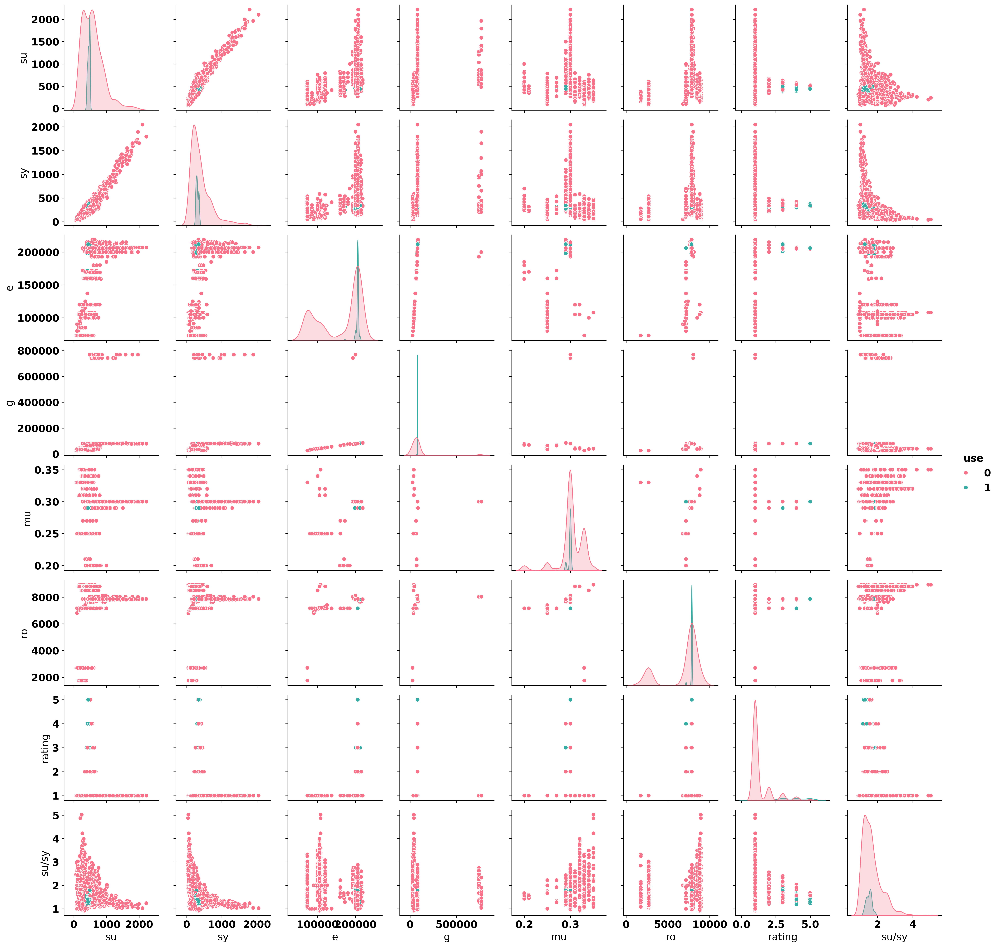

In [127]:
sns.pairplot(df, hue='use', palette='husl')
plt.show()

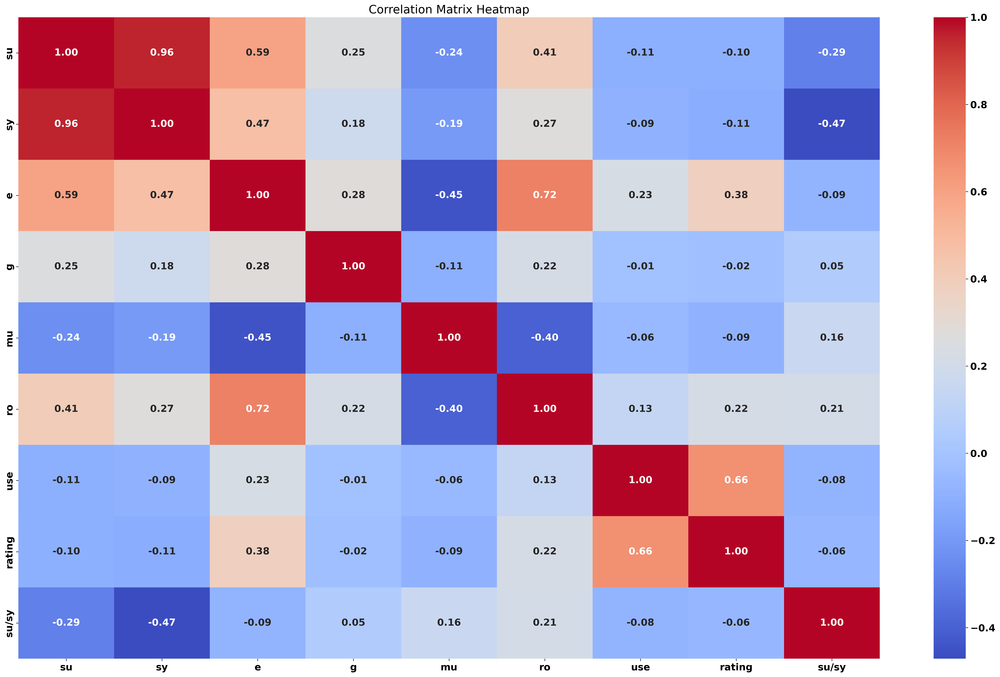

In [128]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix Heatmap')
plt.show()

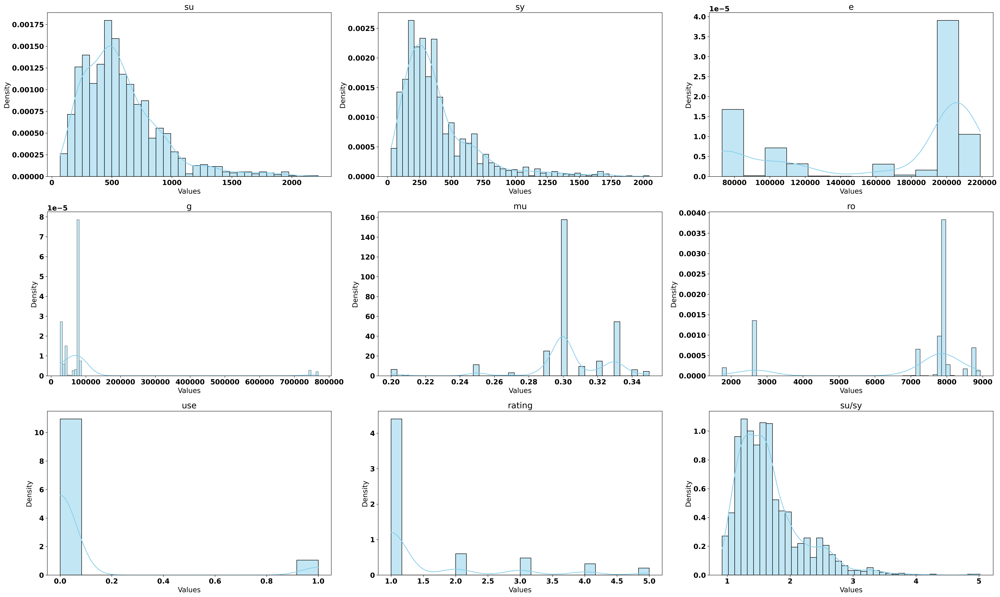

In [129]:
for i, column in enumerate(df.columns):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[column], kde=True, color='skyblue', stat='density')
    plt.title(column)
    plt.xlabel('Values')
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

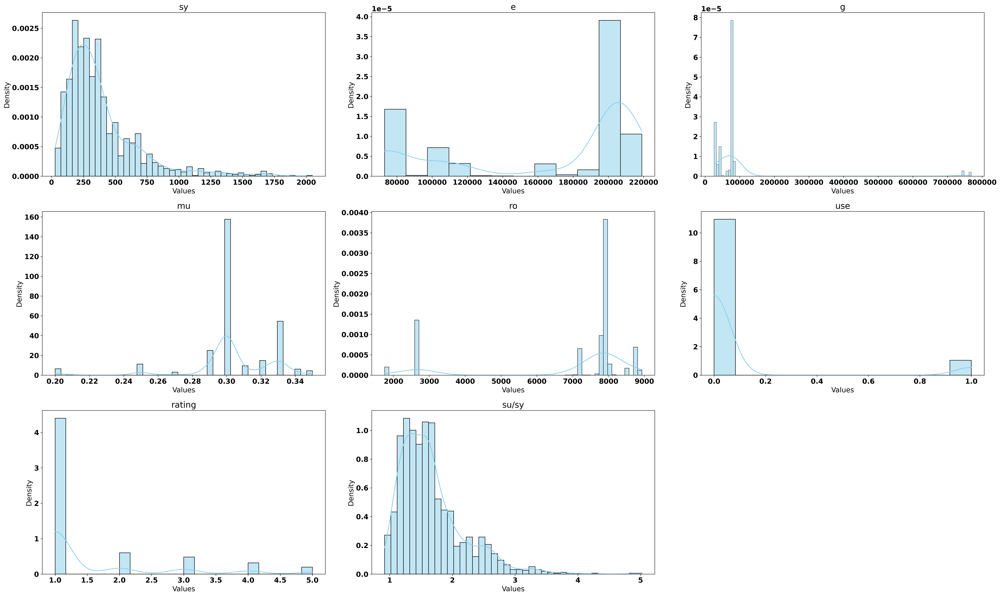

In [130]:
for i, column in enumerate(df.columns[1:]):
    plt.subplot(3, 3, i + 1)
    sns.histplot(df[column], kde=True, color='skyblue', stat='density')
    plt.title(column)
    plt.xlabel('Values')
    plt.ylabel('Density')
plt.tight_layout()
plt.show()

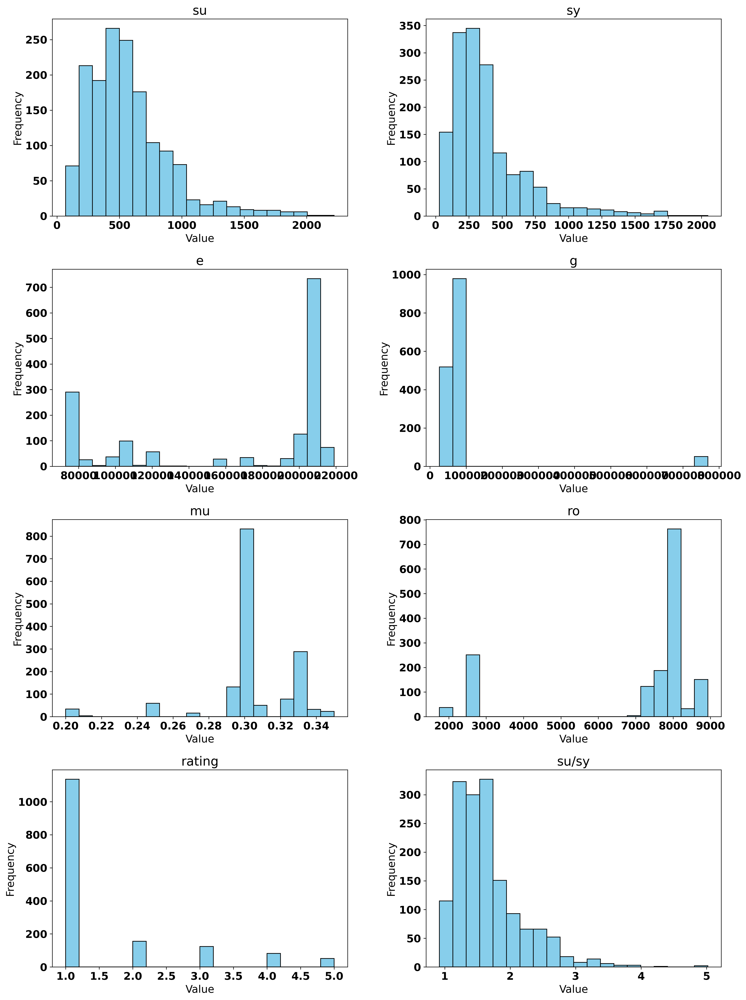

In [131]:


columns_to_plot = ['su', 'sy', 'e', 'g', 'mu', 'ro', 'rating', 'su/sy']

fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

# Plotting each column
for i, column in enumerate(columns_to_plot):
    ax = axes.flatten()[i]
    ax.hist(df[column], bins=20, color='skyblue', edgecolor='black')
    ax.set_title(column)
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

# Adjusting layout
plt.tight_layout()
plt.show()



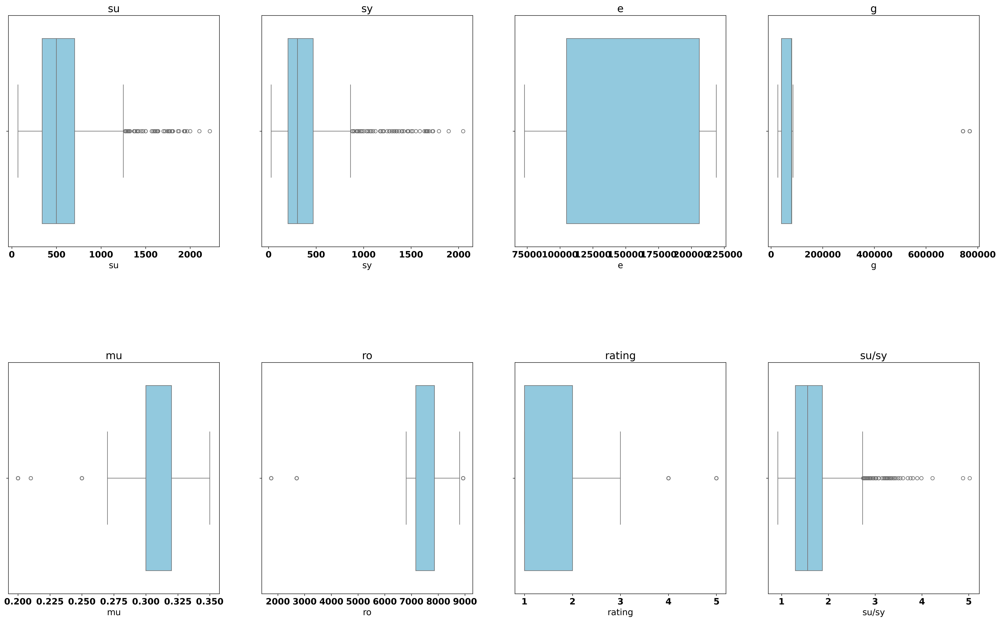

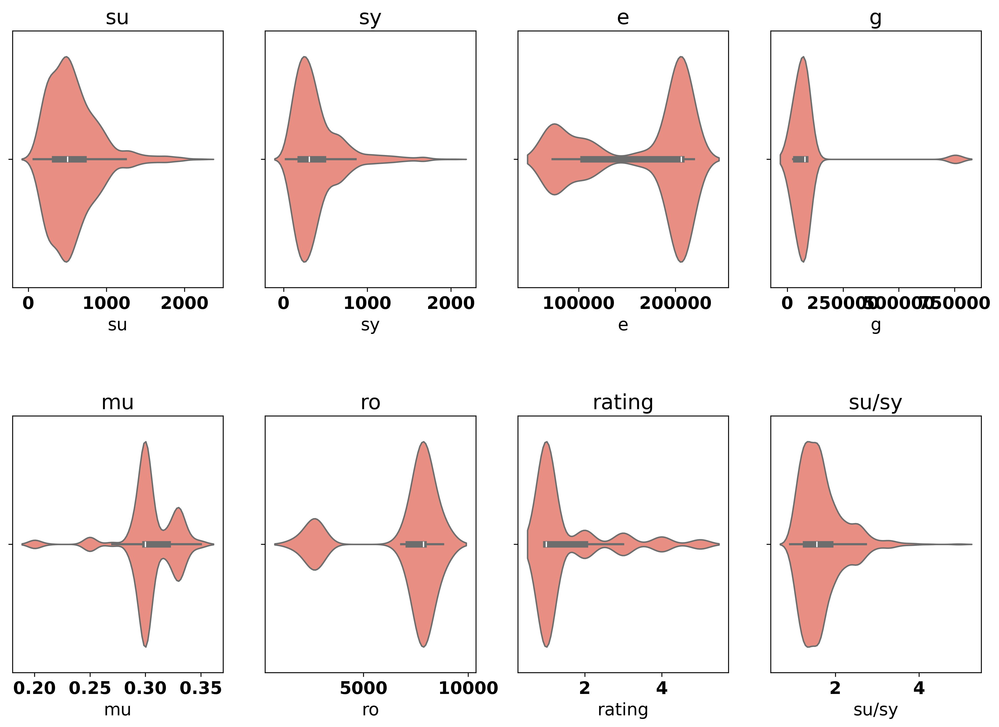

In [132]:


plt.subplots_adjust(hspace=0.5)
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(2, 4, i)
    sns.boxplot(x=df[column], color='skyblue')
    plt.title(column)
plt.figure(figsize=(15, 10))
plt.subplots_adjust(hspace=0.5)
for i, column in enumerate(columns_to_plot, 1):
    plt.subplot(2, 4, i)
    sns.violinplot(x=df[column], color='salmon')
    plt.title(column)

plt.show()



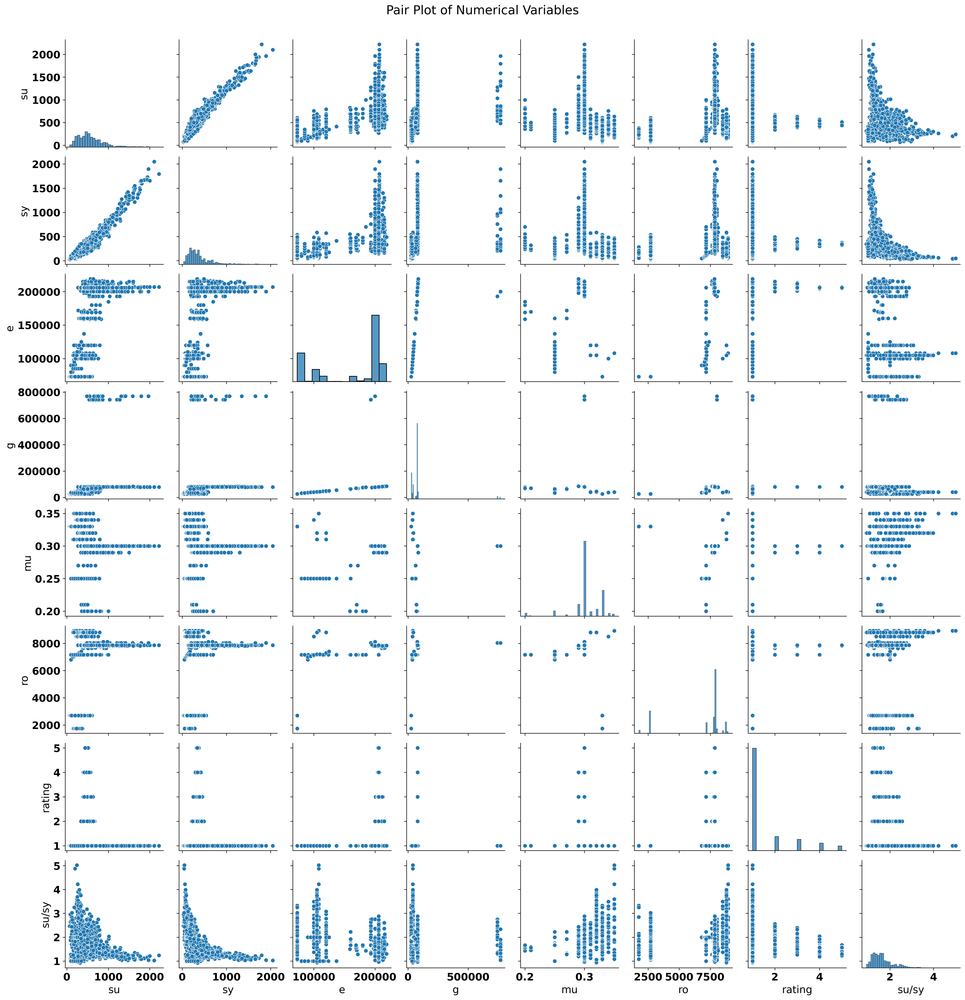

In [133]:
sns.pairplot(df, vars=['su', 'sy', 'e', 'g', 'mu', 'ro', 'rating', 'su/sy'], kind='scatter')
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()



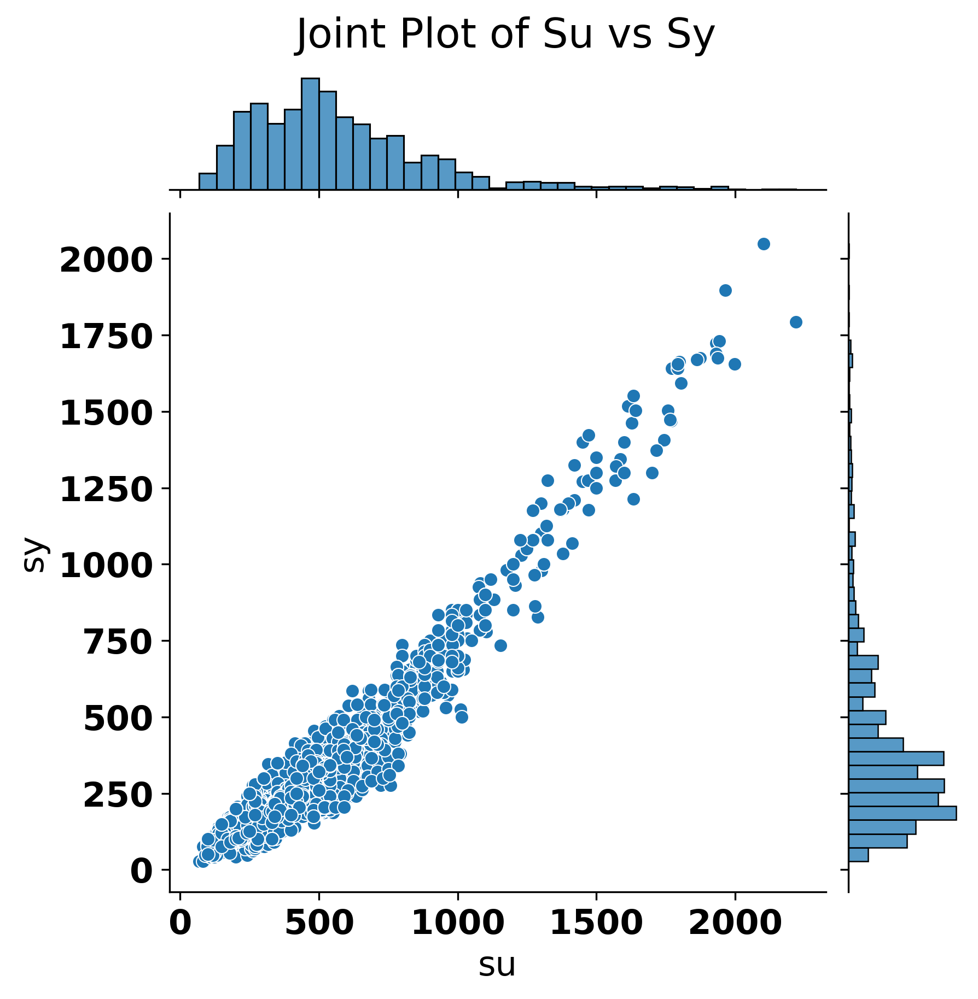

In [134]:
sns.jointplot(data=df, x='su', y='sy', kind='scatter')
plt.suptitle('Joint Plot of Su vs Sy', y=1.02)
plt.show()



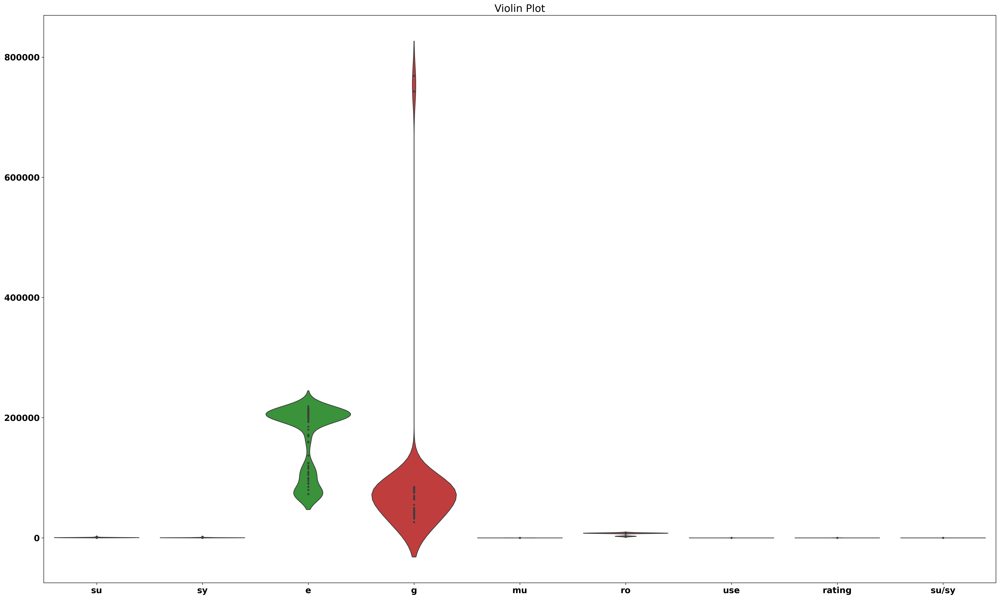

In [135]:
sns.violinplot(data=df, inner='point')
plt.title('Violin Plot')
plt.show()

In [136]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

In [137]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['su', 'sy', 'e', 'g', 'mu']])

In [142]:
from sklearn.model_selection import train_test_split

In [144]:
pca = PCA(n_components=3)  # Choose number of principal components
principal_components = pca.fit_transform(scaled_features)
principal_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3'])
df

,su,sy,e,g,mu,ro,use,rating,su/sy
0,421,314,207000,79000,0.30,7860,1,4,1.340764
1,424,324,207000,79000,0.30,7860,1,4,1.308642
2,386,284,207000,79000,0.30,7860,1,3,1.359155
3,448,331,207000,79000,0.30,7860,1,5,1.353474
4,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...
1547,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,400,180,160000,64000,0.27,7160,0,1,2.222222


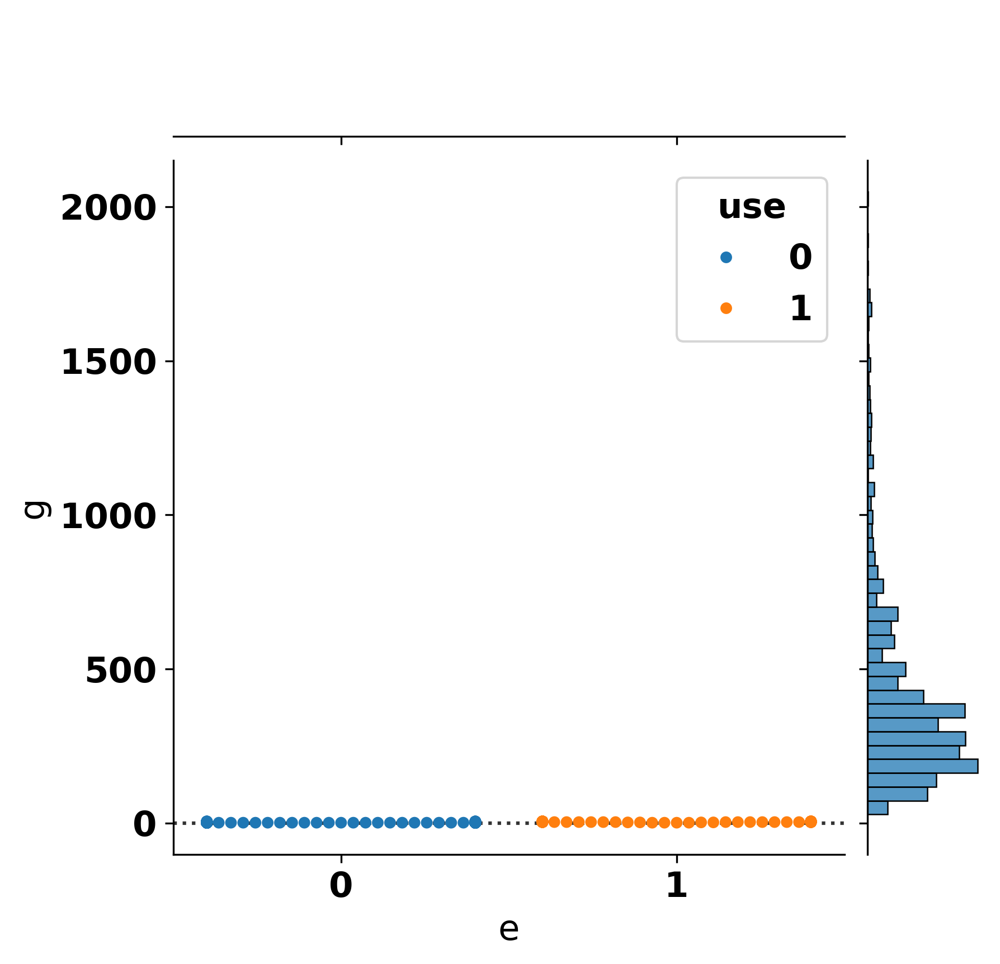

In [146]:
sns.jointplot(x='su', y='sy', data=df, kind='hex')
sns.residplot(x='e', y='g', data=df, scatter_kws={'s': 80})
sns.swarmplot(x='use', y='rating', hue='use', data=df)
plt.show()

ValueError: Contour levels must be increasing

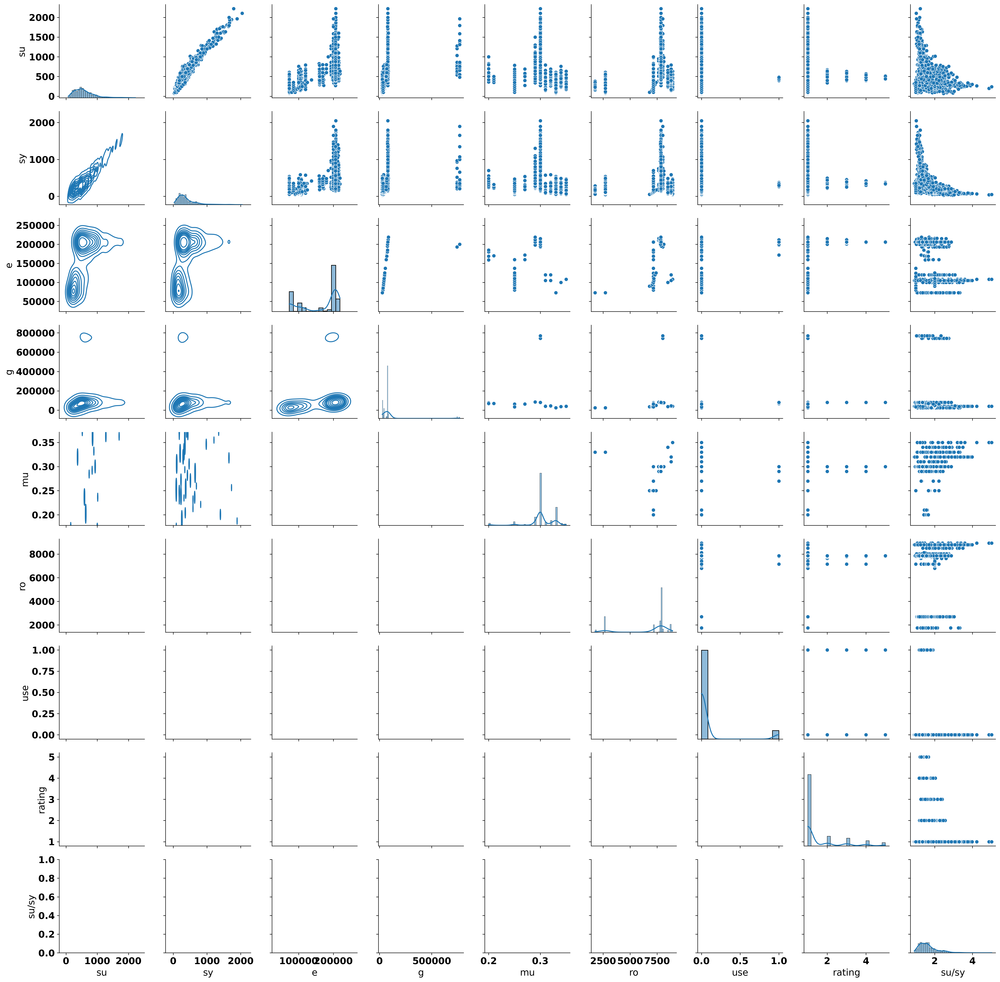

In [149]:
g = sns.PairGrid(df)
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot, kde=True)
g.map_lower(sns.kdeplot)

In [151]:
sns.clustermap(df.corr(), cmap='coolwarm', annot=True)
g = sns.FacetGrid(df, col='use', hue='use')
g.map(sns.scatterplot, 'su', 'sy')
sns.kdeplot(data=df['e'], shade=True)
plt.show()


RuntimeError: clustermap requires scipy to be available

In [150]:
X = df.drop(columns=['use'])
y = df['use']

oversampler = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

resampled_df = pd.DataFrame(X_resampled, columns=X.columns)
resampled_df['Use'] = y_resampled

print(resampled_df)

NameError: name 'SMOTE' is not defined

In [152]:
sns.clustermap(df.corr(), cmap='coolwarm', annot=True)
g = sns.FacetGrid(df, col='use', hue='use')
g.map(sns.scatterplot, 'su', 'sy')
sns.kdeplot(data=df['e'], shade=True)
plt.show()

RuntimeError: clustermap requires scipy to be available

In [154]:
X = df.drop(columns=['use'])
y = df['use']

oversampler = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = oversampler.fit_resample(X, y)

resampled_df = pd.DataFrame(X_resampled, columns=X.columns)
resampled_df['use'] = y_resampled

print(resampled_df)
resampled_df["use"].value_counts()

NameError: name 'SMOTE' is not defined

In [155]:
df

,su,sy,e,g,mu,ro,use,rating,su/sy
0,421,314,207000,79000,0.30,7860,1,4,1.340764
1,424,324,207000,79000,0.30,7860,1,4,1.308642
2,386,284,207000,79000,0.30,7860,1,3,1.359155
3,448,331,207000,79000,0.30,7860,1,5,1.353474
4,441,346,207000,79000,0.30,7860,1,5,1.274566
...,...,...,...,...,...,...,...,...,...
1547,600,370,169000,70000,0.20,7160,0,1,1.621622
1548,700,420,169000,70000,0.20,7160,0,1,1.666667
1549,800,480,169000,70000,0.20,7160,0,1,1.666667
1550,400,180,160000,64000,0.27,7160,0,1,2.222222


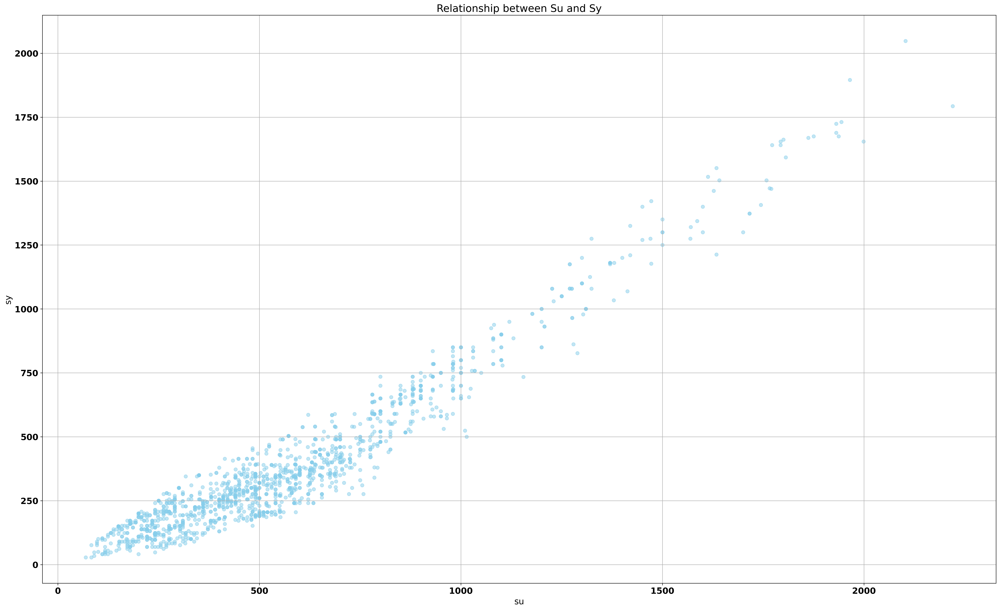

In [156]:
plt.scatter(df['su'], df['sy'], color='skyblue', alpha=0.5)
plt.xlabel('su')
plt.ylabel('sy')
plt.title('Relationship between Su and Sy')
plt.grid(True)
plt.show()

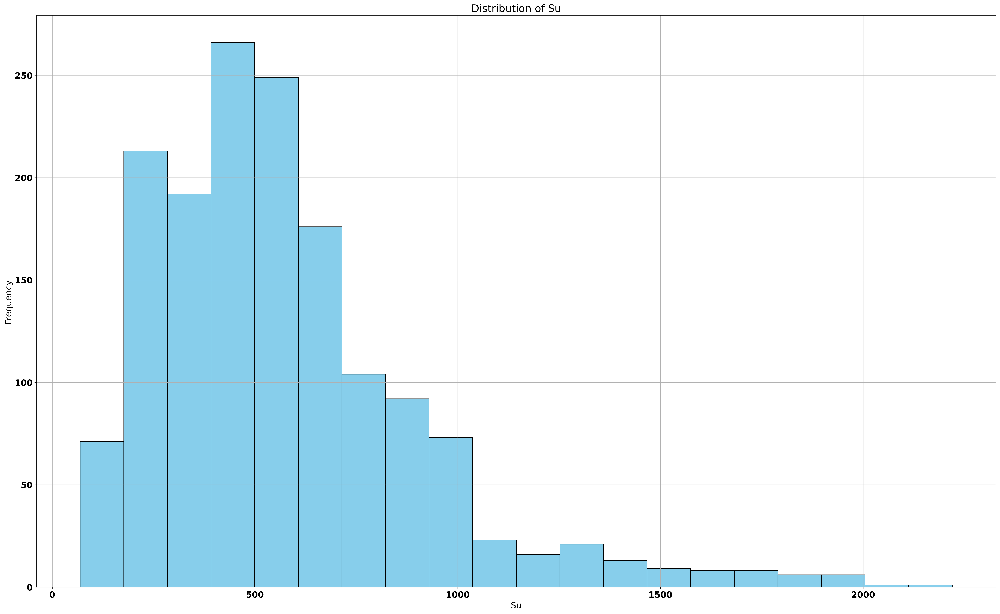

In [157]:
plt.hist(df['su'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Su')
plt.ylabel('Frequency')
plt.title('Distribution of Su')
plt.grid(True)
plt.show()

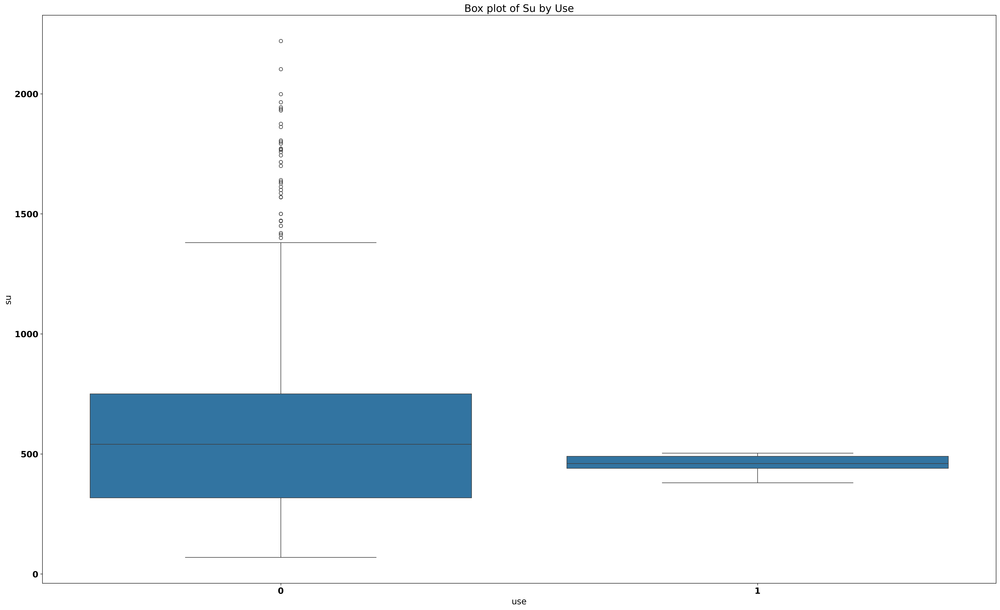

In [158]:
sns.boxplot(x=df['use'], y=df['su'])
plt.xlabel('use')
plt.ylabel('su')
plt.title('Box plot of Su by Use')
plt.show()

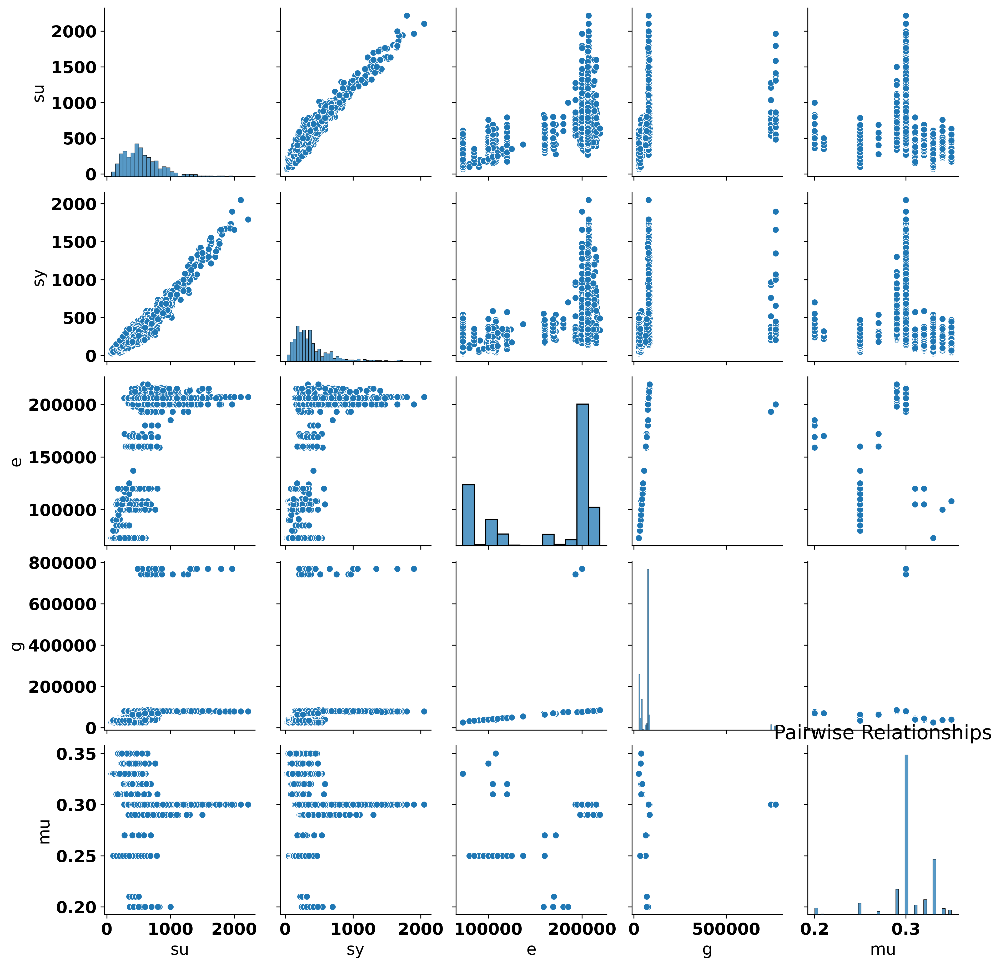

In [159]:
sns.pairplot(df[['su', 'sy', 'e', 'g', 'mu']])
plt.title('Pairwise Relationships')
plt.show()

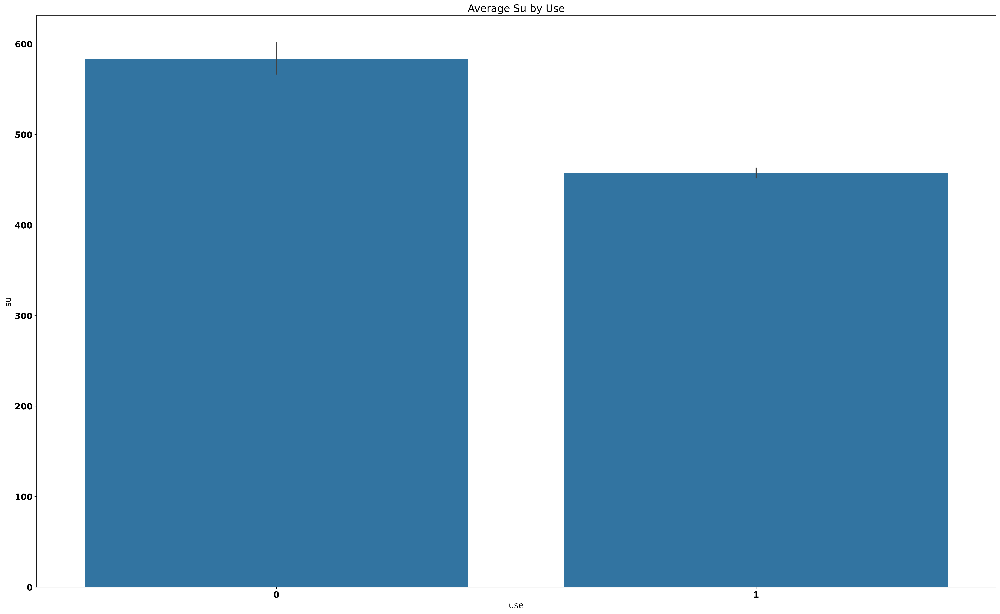

In [160]:
sns.barplot(x='use', y='su', data=df)
plt.xlabel('use')
plt.ylabel('su')
plt.title('Average Su by Use')
plt.show()

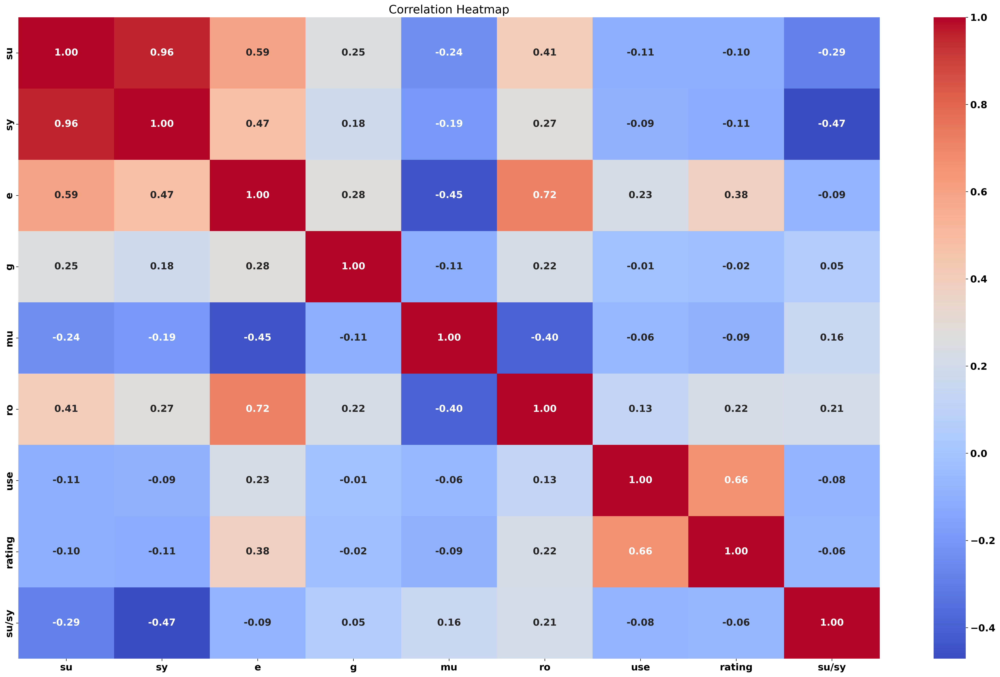

In [161]:
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

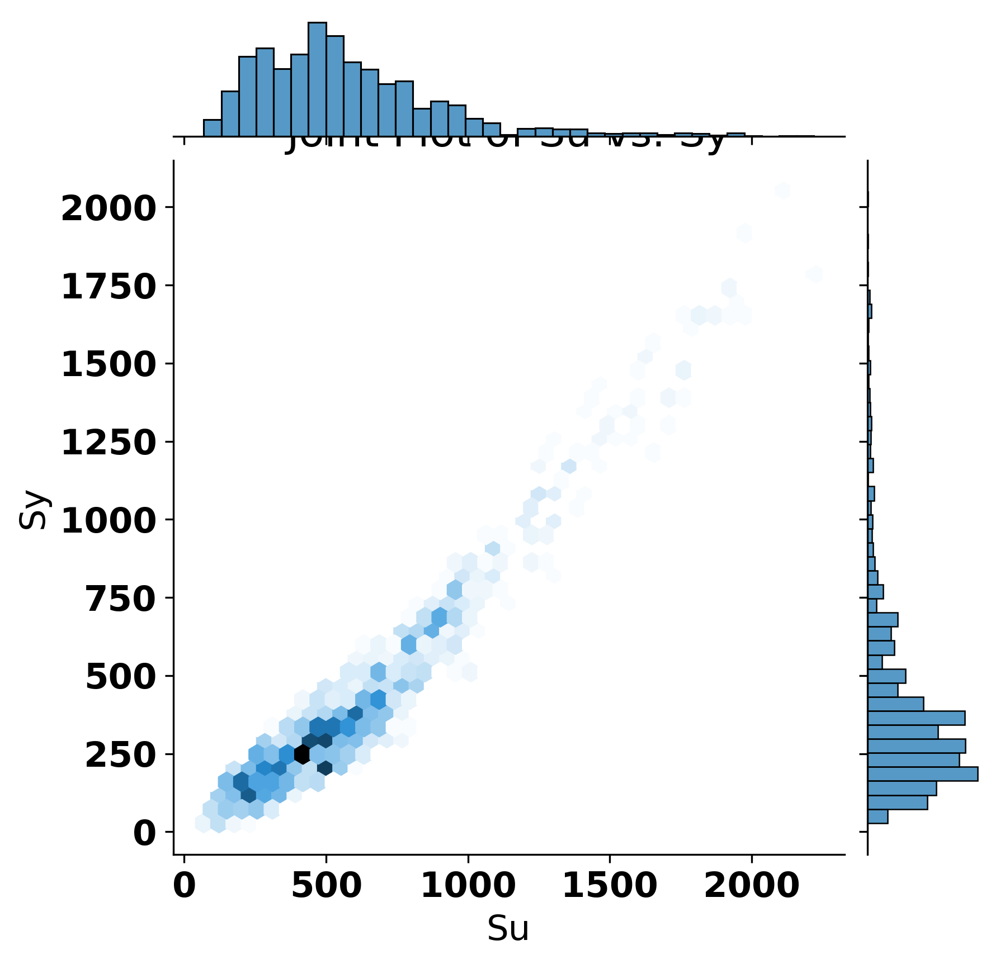

In [162]:
sns.jointplot(x='su', y='sy', data=df, kind='hex')
plt.xlabel('Su')
plt.ylabel('Sy')
plt.title('Joint Plot of Su vs. Sy')
plt.show()